### The Battle of Neighbourhoods -- Examining the school zones in Greater London

#### Introduction 
___

This project tries to identify school zone neighborhoods in the Greater London area of UK and to explore the possible correlations with home price. For new immigrants, one top concern when picking the landing neighbourhood is about having good access to schoolings. 

For simplicity, the initial project focuses on only the Greater London area.  But this is a scalable project that can expand to other geographies and also take consideration of other metrics such as crime rate, transportation, average income, etc into consideration.

#### Data
____
To perform the analysis, we collected data from 3 major sources:
- UK's postcode and geocode data (longitude & latitude) from FreeMapTools ([Link](https://www.freemaptools.com/download-uk-postcode-lat-lng.htm))
- UK home price data from Gov.uk ([link](https://www.gov.uk/government/statistical-data-sets/price-paid-data-downloads))
- Greater London area's postal districts and neighbourhoods from Wikipedia
- Venue data from Foursquare API

### Approach
___
The project contains the following main steps:
1. Data cleansing and pre-processing
2. Visualize the house prices of each neighbourhood in Choropleth map
3. Use Foursquare API to obtain the school venues in each neighbourhood
4. Conduct cluster analysis on the neighbourhoods
5. Obtain preliminary conclusions

In [1]:
#import libraries
import numpy as np
import pandas as pd

#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

import json 
import matplotlib.cm as cm
import matplotlib.colors as colors
import folium

import geopy
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests 
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
from sklearn.cluster import KMeans

import geopandas as gpd

print('Libraries imported.')

Libraries imported.


#### Data cleansing and pre-processing

In [2]:
ukgeo = pd.read_csv('ukpostcodes.csv',header =0)

In [3]:
ukgeo.head()

,id,postcode,latitude,longitude
0,1,AB10 1XG,57.144165,-2.114848
1,2,AB10 6RN,57.137880,-2.121487
2,3,AB10 7JB,57.124274,-2.127190
3,4,AB11 5QN,57.142701,-2.093295
4,5,AB11 6UL,57.137547,-2.112233


In [4]:
#split the postcode to only the first half district code
ukgeo.drop(columns='id',inplace=True)
ukgeo['district'] = ukgeo.postcode.str.split(" ").str[0]

In [5]:
ukgeo.head()

,postcode,latitude,longitude,district
0,AB10 1XG,57.144165,-2.114848,AB10
1,AB10 6RN,57.137880,-2.121487,AB10
2,AB10 7JB,57.124274,-2.127190,AB10
3,AB11 5QN,57.142701,-2.093295,AB11
4,AB11 6UL,57.137547,-2.112233,AB11


In [6]:
#group by the district code and set the district code as index
ukgeo_district = ukgeo.groupby('district').mean()

In [7]:
ukgeo_district.head()

,latitude,longitude
district,,
AB10,57.135204,-2.120402
AB11,57.139148,-2.092871
AB12,57.102113,-2.112707
AB13,57.107919,-2.237453
AB14,57.100449,-2.271324


In [8]:
#read the uk postcode polygon boundary file
districts = gpd.GeoDataFrame.from_file("Distribution/Districts.shp")
districts.head()

,name,geometry
0,AB10,"POLYGON ((-2.11645 57.14656, -2.11655 57.14663..."
1,AB11,"MULTIPOLYGON (((-2.05257 57.13426, -2.05729 57..."
2,AB12,"MULTIPOLYGON (((-2.12807 57.03684, -2.12986 57..."
3,AB13,"POLYGON ((-2.26153 57.10694, -2.27015 57.11525..."
4,AB14,"POLYGON ((-2.26153 57.10694, -2.26315 57.10619..."


In [9]:
#load transcation data
price_data = pd.read_csv("pp-2020.csv", names=['price', 'postcode','county'], usecols=[1, 3,13])
price_data = price_data[price_data.county == 'GREATER LONDON']
price_data['district'] = price_data.postcode.str.split(" ").str[0]
price_data.head()


,price,postcode,county,district
194,1200000,W12 8NT,GREATER LONDON,W12
864,1360000,N10 2DJ,GREATER LONDON,N10
865,300000,IG4 5HR,GREATER LONDON,IG4
866,560000,HA4 9HR,GREATER LONDON,HA4
867,710000,NW1 7TJ,GREATER LONDON,NW1


In [10]:
#get the median price of each district
price_by_district = price_data.groupby("district").median()
price_by_district.head(10)

,price
district,
BR1,422500.0
BR2,450000.0
BR3,467275.0
BR4,559500.0
BR5,365000.0
BR6,480000.0
BR7,537500.0
BR8,845000.0
CR0,344500.0


In [11]:
#join the district geometry table with the median price table
districts['median_price'] = price_by_district.price.reindex(districts.name).values
districts.dropna(inplace=True)

In [12]:
price_bins = list(districts.median_price.quantile([0, 0.1, 0.25, 0.5, 0.75, 0.9, 1]))
price_bins

[32656.0,
 354998.5,
 420000.0,
 504375.0,
 724375.0,
 1363899.4000000001,
 40500000.0]

#### Create the choropleth map that inidicates median home price of Greater London area in 2020

In [13]:
#find the coordinates for London
address = 'London, UK'

geolocator = Nominatim(user_agent="UK_explorer")
location = geolocator.geocode(address)
london_lat = location.latitude
london_lng = location.longitude
print('The geograpical coordinate of London are {}, {}.'.format(london_lat, london_lng))

The geograpical coordinate of London are 51.5073219, -0.1276474.


In [14]:
#Choropleth map
m = folium.Map(
    location=[51.51, -0.13],
    zoom_start=10 
)

folium.Choropleth(
    geo_data=districts,
    data=districts,
    columns=['name','median_price'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.3,
    legend_name='Greater London Home Median Price 2020',
    bins=price_bins,
).add_to(m)

m

#### Explore the district neighbourhoods

In [15]:
districts.set_index('name',inplace = True)

In [16]:
neighbourhoods = districts.join(ukgeo_district)

In [17]:
neighbourhoods.reset_index(inplace = True)
neighbourhoods.head()

,name,geometry,median_price,latitude,longitude
0,BR1,"POLYGON ((0.05121 51.40747, 0.05136 51.40681, ...",422500.0,51.412005,0.020872
1,BR2,"POLYGON ((0.05066 51.35885, 0.05080 51.35864, ...",450000.0,51.387283,0.022423
2,BR3,"POLYGON ((-0.04341 51.38967, -0.04437 51.39023...",467275.0,51.404599,-0.030536
3,BR4,"POLYGON ((0.01176 51.37012, 0.01237 51.37062, ...",559500.0,51.375009,-0.008362
4,BR5,"POLYGON ((0.08997 51.40117, 0.08995 51.40233, ...",365000.0,51.391729,0.103364


#### Explore the schools

In [18]:
# Foursquare credentials (deleted for sharing, please use your own)
CLIENT_ID = # Foursquare ID
CLIENT_SECRET =  # Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

In [19]:
#School_ID = '4bf58dd8d48988d13b941735' #For all schools
elementary_ID = '4f4533804b9074f6e4fb0105' #For elementary schools
nursery_ID = '4f4533814b9074f6e4fb0107' #For nursery schools
middle_ID = '4f4533814b9074f6e4fb0106' #For middle schools
high_ID = '4bf58dd8d48988d13d941735' #For high schools
private_ID = '52e81612bcbc57f1066b7a46' #For private schools
university_ID = '4bf58dd8d48988d1ae941735' #For university
#college_ID = '4d4b7105d754a06372d81259' #For college & university


neighbourhoods['nursery'] = ''
neighbourhoods['elementary'] = ''
neighbourhoods['middle'] = ''
neighbourhoods['high'] = ''
neighbourhoods['private'] = ''
neighbourhoods['university'] = ''
#neighbourhoods['college'] = ''


In [20]:
neighbourhoods.iloc[0,3]


51.4120046821996

In [21]:
len(neighbourhoods)

278

In [23]:
neighbourhoods = pd.read_csv('neighbourhoods-1.csv')

In [29]:
neighbourhoods.drop(neighbourhoods.columns[0],axis=1, inplace=True)

In [30]:
neighbourhoods.head()

,name,geometry,median_price,latitude,longitude,nursery,elementary,middle,high,private,university,college
0,BR1,POLYGON ((0.05121454384466867 51.4074673847175...,422500.0,51.412005,0.020872,2,0,0,0.0,NaN,NaN,NaN
1,BR2,POLYGON ((0.05066267470546424 51.3588452056630...,450000.0,51.387283,0.022423,0,0,0,0.0,NaN,NaN,NaN
2,BR3,POLYGON ((-0.0434086970429628 51.3896655903226...,467275.0,51.404599,-0.030536,0,0,0,0.0,NaN,NaN,NaN
3,BR4,POLYGON ((0.01176153492096194 51.3701180983686...,559500.0,51.375009,-0.008362,0,0,0,0.0,NaN,NaN,NaN
4,BR5,POLYGON ((0.08997187392585966 51.4011665702235...,365000.0,51.391729,0.103364,0,0,0,0.0,NaN,NaN,NaN


In [31]:
def Get_Number_Of_Venues(ID, category, Radius=500):
    for i in range(len(neighbourhoods)):
        p_lat = neighbourhoods.iloc[i,3] 
        p_lon = neighbourhoods.iloc[i,4] 
        url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&categoryId={}&radius={}&limit={}'.format(
            CLIENT_ID,
            CLIENT_SECRET,
            p_lat,
            p_lon,
            VERSION,
            ID,
            Radius,
            LIMIT) 
        results = requests.get(url).json()
        venue = results['response']['venues']
        count = np.shape(venue)
        neighbourhoods.loc[i, category] = count[0]

In [32]:
Get_Number_Of_Venues(nursery_ID,'nursery')
Get_Number_Of_Venues(elementary_ID,'elementary')
Get_Number_Of_Venues(middle_ID,'middle')
Get_Number_Of_Venues(high_ID,'high')
Get_Number_Of_Venues(private_ID,'private')
Get_Number_Of_Venues(university_ID,'university')

In [43]:
neighbourhoods.to_csv('neighbourhoods-2.csv')

In [42]:
neighbourhoods.head()

,name,geometry,median_price,latitude,longitude,nursery,elementary,middle,high,private,university
0,BR1,POLYGON ((0.05121454384466867 51.4074673847175...,422500.0,51.412005,0.020872,2,0,0,0.0,0.0,0.0
1,BR2,POLYGON ((0.05066267470546424 51.3588452056630...,450000.0,51.387283,0.022423,0,0,0,0.0,0.0,0.0
2,BR3,POLYGON ((-0.0434086970429628 51.3896655903226...,467275.0,51.404599,-0.030536,0,0,0,0.0,0.0,0.0
3,BR4,POLYGON ((0.01176153492096194 51.3701180983686...,559500.0,51.375009,-0.008362,0,0,0,0.0,0.0,0.0
4,BR5,POLYGON ((0.08997187392585966 51.4011665702235...,365000.0,51.391729,0.103364,0,0,0,0.0,0.0,0.0


#### Cluster the Neighbourhoods

In [44]:
school_cluster = neighbourhoods.iloc[:,5:]
school_cluster.head(10)

,nursery,elementary,middle,high,private,university
0,2,0,0,0.0,0.0,0.0
1,0,0,0,0.0,0.0,0.0
2,0,0,0,0.0,0.0,0.0
3,0,0,0,0.0,0.0,0.0
4,0,0,0,0.0,0.0,0.0
5,0,0,0,0.0,0.0,0.0
6,0,0,0,0.0,0.0,0.0
7,0,0,0,0.0,0.0,0.0
8,2,0,0,0.0,0.0,0.0
9,0,1,0,0.0,0.0,0.0


In [46]:
cluster_num = 3
school_kmeans = KMeans(n_clusters = cluster_num, random_state = 0).fit(school_cluster)

In [47]:
neighbourhoods.insert(0,'cluster', school_kmeans.labels_)
neighbourhoods.head()

,cluster,name,geometry,median_price,latitude,longitude,nursery,elementary,middle,high,private,university
0,0,BR1,POLYGON ((0.05121454384466867 51.4074673847175...,422500.0,51.412005,0.020872,2,0,0,0.0,0.0,0.0
1,0,BR2,POLYGON ((0.05066267470546424 51.3588452056630...,450000.0,51.387283,0.022423,0,0,0,0.0,0.0,0.0
2,0,BR3,POLYGON ((-0.0434086970429628 51.3896655903226...,467275.0,51.404599,-0.030536,0,0,0,0.0,0.0,0.0
3,0,BR4,POLYGON ((0.01176153492096194 51.3701180983686...,559500.0,51.375009,-0.008362,0,0,0,0.0,0.0,0.0
4,0,BR5,POLYGON ((0.08997187392585966 51.4011665702235...,365000.0,51.391729,0.103364,0,0,0,0.0,0.0,0.0


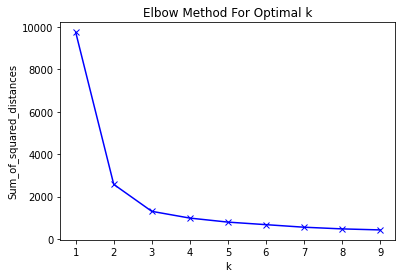

In [45]:
#optimal number of clusters
%matplotlib inline
import matplotlib.pyplot as plt

elbow = []
for k in range(1,10):
    km = KMeans(n_clusters = k, random_state = 0).fit(school_cluster)
    elbow.append(km.inertia_)
    
K = range(1,10)
#plt.figure(figsize =(20,10))
plt.plot(K,  elbow,'bx-')
plt.xlabel('k')  
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [48]:
school_avg = neighbourhoods.groupby('cluster').mean()
school_avg

,median_price,latitude,longitude,nursery,elementary,middle,high,private,university
cluster,,,,,,,,,
0,8.033236e+05,51.501848,-0.115711,0.396694,0.557851,0.037190,0.330579,0.057851,0.446281
1,1.564242e+06,51.518466,-0.129148,0.851852,0.777778,0.037037,0.518519,0.370370,12.037037
2,1.308238e+06,51.519672,-0.126774,0.222222,0.444444,0.000000,0.333333,0.666667,26.000000


#### Visualize the clusters

In [51]:
#bring up the London map
#map_clusters = folium.Map(location=[london_lat, london_lng], zoom_start=10)

# set color scheme for the clusters
x = np.arange(cluster_num)
ys = [i + x + (i*x)**2 for i in range(cluster_num)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster, price in zip(neighbourhoods['latitude'], neighbourhoods['longitude'], neighbourhoods['name'], neighbourhoods['cluster'],neighbourhoods['median_price']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster) + ' Median Price ' + str(price), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(m)
       
m

In [55]:
#What if we drop the university column?
school_cluster2 = neighbourhoods.iloc[:,6:11]
school_cluster2.head(10)

,nursery,elementary,middle,high,private
0,2,0,0,0.0,0.0
1,0,0,0,0.0,0.0
2,0,0,0,0.0,0.0
3,0,0,0,0.0,0.0
4,0,0,0,0.0,0.0
5,0,0,0,0.0,0.0
6,0,0,0,0.0,0.0
7,0,0,0,0.0,0.0
8,2,0,0,0.0,0.0
9,0,1,0,0.0,0.0


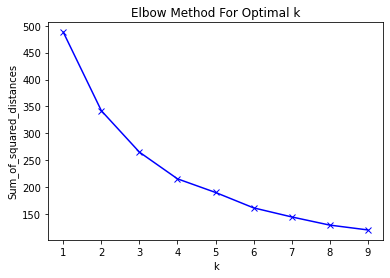

In [57]:
#optimal number of clusters
elbow2 = []
for k in range(1,10):
    km = KMeans(n_clusters = k, random_state = 0).fit(school_cluster2)
    elbow2.append(km.inertia_)
    
K = range(1,10)
#plt.figure(figsize =(20,10))
plt.plot(K,  elbow2,'bx-')
plt.xlabel('k')  
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [62]:
cluster2_num = 4
school_kmeans = KMeans(n_clusters = cluster2_num, random_state = 0).fit(school_cluster2)

In [72]:
neighbourhoods.insert(0,'cluster2', school_kmeans.labels_)
neighbourhoods.head()

,cluster2,cluster22,cluster,name,geometry,median_price,latitude,longitude,nursery,elementary,middle,high,private,university
0,1,1,0,BR1,POLYGON ((0.05121454384466867 51.4074673847175...,422500.0,51.412005,0.020872,2,0,0,0.0,0.0,0.0
1,0,0,0,BR2,POLYGON ((0.05066267470546424 51.3588452056630...,450000.0,51.387283,0.022423,0,0,0,0.0,0.0,0.0
2,0,0,0,BR3,POLYGON ((-0.0434086970429628 51.3896655903226...,467275.0,51.404599,-0.030536,0,0,0,0.0,0.0,0.0
3,0,0,0,BR4,POLYGON ((0.01176153492096194 51.3701180983686...,559500.0,51.375009,-0.008362,0,0,0,0.0,0.0,0.0
4,0,0,0,BR5,POLYGON ((0.08997187392585966 51.4011665702235...,365000.0,51.391729,0.103364,0,0,0,0.0,0.0,0.0


In [75]:
school_avg2 = neighbourhoods.groupby('cluster2').mean()
school_avg2

,cluster,median_price,latitude,longitude,nursery,elementary,middle,high,private,university
cluster2,,,,,,,,,,
0,0.090909,858551.041667,51.499513,-0.114095,0.121212,0.000000,0.037879,0.143939,0.068182,1.356061
1,0.173913,664130.413043,51.483990,-0.119347,2.391304,1.260870,0.086957,0.521739,0.217391,2.956522
2,0.212766,988078.957447,51.512464,-0.112194,0.255319,1.297872,0.010638,0.202128,0.159574,3.021277
3,0.310345,928614.655172,51.513234,-0.147525,0.896552,0.310345,0.068966,1.620690,0.034483,4.689655


In [82]:
#bring up the London map
m2 = folium.Map(location=[london_lat, london_lng], zoom_start=10)

#bring up the choropleth
folium.Choropleth(
    geo_data=districts,
    data=districts,
    columns=['name','median_price'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.3,
    legend_name='Greater London Home Median Price & School Zones 2020',
    bins=price_bins,
).add_to(m2)

# set color scheme for the clusters
x = np.arange(cluster_num)
ys = [i + x + (i*x)**2 for i in range(cluster2_num)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster, price in zip(neighbourhoods['latitude'], neighbourhoods['longitude'], neighbourhoods['name'], neighbourhoods['cluster2'],neighbourhoods['median_price']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster) + ' Price' + str(price), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=False).add_to(m2)
       
m2

### Premliminary Conclusions
1. For migrant families with kids that require school placement, Cluster 0 areas generally would have less choices  
2. For families with young kids whom go to nursery or elementary schools, Cluster 1 areas would have more choices 

3. One may consider Cluster 1 areas in the outter rings of Greater London with relatively lower home prices

#### For illustration, let's further explore the KT1 neighbourhood

In [88]:
KT1 = neighbourhoods.loc[neighbourhoods['name']=='KT1']

In [89]:
KT1

,cluster2,cluster,name,geometry,median_price,latitude,longitude,nursery,elementary,middle,high,private,university
92,1,0,KT1,POLYGON ((-0.2981585245824133 51.4103501933488...,480000.0,51.407631,-0.29835,2,2,0,1.0,0.0,4.0


In [144]:
#get the nearby venues of a given location

def getNearbyVenues(names, latitudes, longitudes, radius=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [145]:
KT1_venues = getNearbyVenues(names=KT1['name'],latitudes=KT1['latitude'],longitudes=KT1['longitude'])
                             


KT1


In [146]:
KT1_neighbourhood = KT1_venues.groupby('Venue Category').count()
KT1_neighbourhood.iloc[:,0]

Venue Category
Arts & Crafts Store          1
Asian Restaurant             1
Bakery                       1
Bar                          2
Beer Bar                     1
Bookstore                    2
Breakfast Spot               1
Burger Joint                 4
Burrito Place                1
Café                         6
Cajun / Creole Restaurant    1
Candy Store                  1
Chinese Restaurant           1
Chocolate Shop               1
Clothing Store               4
Coffee Shop                  8
Cosmetics Shop               1
Department Store             3
Dessert Shop                 1
Donut Shop                   1
Electronics Store            1
Falafel Restaurant           1
Fish & Chips Shop            1
French Restaurant            1
Furniture / Home Store       1
Gastropub                    2
German Restaurant            1
Gift Shop                    1
Gym / Fitness Center         2
Hookah Bar                   1
Hotel                        2
Indian Restaurant       